# Set up

In [ ]:
# @title install libraries
!pip install datasets[vision]

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 521.2/521.2 kB 3.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 115.3/115.3 kB 14.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 134.8/134.8 kB 13.0 MB/s eta 0:00:00


In [ ]:
# @title Import libraries
import torch
import torch.nn as nn
import torch.optim as optim
import torch.nn.functional as F

import random
import numpy as np
from PIL import Image
from tqdm import tqdm
from datasets import load_dataset
from torchvision import transforms

import os
import shutil
import seaborn as sns
from base64 import b64encode
import matplotlib.pyplot as plt
from IPython.display import HTML
from typing import List, Dict, Union

In [ ]:
# @title define util functions <a name="utils"></a>
def get_image(x):
  tensor_image = x[0].detach().cpu()*.5+.5
  numpy_image = tensor_image.numpy()*255
  numpy_image = numpy_image.astype(np.uint8)
  return Image.fromarray(numpy_image)
def get_image_and_prediction(x,prediction):
    prediction = prediction.detach().cpu()
    tensor_image = torch.zeros((3,x.size(1),x.size(2)))
    tensor_image[1,:,:] += prediction
    tensor_image[0,:,:] += 1.0 - prediction
    tensor_image[:,:,:] *= (x.repeat(3,1,1).detach().cpu()*.5+.5)
    numpy_image = tensor_image.permute(1,2,0).numpy()*255
    numpy_image = numpy_image.astype(np.uint8)
    return Image.fromarray(numpy_image)
def image_grid(imgs, rows, cols):
    assert len(imgs) == rows*cols
    w, h = imgs[0].size
    grid = Image.new('RGB', size=(cols*w, rows*h))
    grid_w, grid_h = grid.size
    for i, img in enumerate(imgs):
        grid.paste(img, box=(i%cols*w, i//cols*h))
    return grid
def double_grid(imgs_1,imgs_2, rows, cols, offset:int=50):
    assert len(imgs_1)+len(imgs_2) == rows*(cols*2)
    assert imgs_1[0].size == imgs_2[0].size
    w, h = imgs_1[0].size
    grid = Image.new('RGB', size=(cols*w*2+offset, rows*h))
    grid_w, grid_h = grid.size
    for i, (img1,img2) in enumerate(zip(imgs_1,imgs_2)):
        grid.paste(img1, box=(i%cols*w, i//cols*h))
        grid.paste(img2, box=(i%cols*w+cols*w+offset, i//cols*h))
    return grid
def show_video(video_path, video_width = 1000):
  video_file = open(video_path, "r+b").read()
  video_url = f"data:video/mp4;base64,{b64encode(video_file).decode()}"
  return HTML(f"""<video width={video_width} controls><source src="{video_url}"></video>""")

In [ ]:
# @title set seed
seed = 42
random.seed(seed)
torch.manual_seed(seed)
torch.use_deterministic_algorithms(True)

In [ ]:
# @title Get the data and resize to 32*32 images
image_size = 32
# MNIST Dataset
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5), std=(0.5))])

def preprocess_function(examples):
  examples['pixel_values'] = [transform(image) for image in examples['image']]
  return examples

dataset = load_dataset("mnist", split="train")
dataset = dataset.map(preprocess_function, batched=True)

Extracting data files:   0%|          | 0/4 [00:00<?, ?it/s]

Generating train split:   0%|          | 0/60000 [00:00<?, ? examples/s]

Generating test split:   0%|          | 0/10000 [00:00<?, ? examples/s]

Map:   0%|          | 0/60000 [00:00<?, ? examples/s]

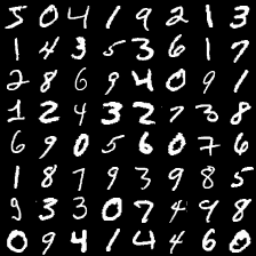

In [ ]:
ground_truth = [image.resize((image_size,image_size),Image.Resampling.BILINEAR) for image in dataset[:64]['image']]
image_grid(ground_truth,8,8)

# 1 - Build a GAN for MNIST dataset

## 1.a Model architecture

In [ ]:
#@title Define Generator and Discrimantor
class Generator(nn.Module):
    def __init__(self, z_dim: int, last_hidden_features:int):
        super(Generator, self).__init__()
        self.model = nn.Sequential(                                                                          # input:  (bs, 100, 1, 1)
            self.make_transpose_block(z_dim,last_hidden_features*4,4,1,0),                                   # output: (bs, hidden_dim*4, 4, 4)
            self.make_transpose_block(last_hidden_features*4,last_hidden_features*2,4,2,1),                  # output: (bs, hidden_dim*2, 8, 8)
            self.make_transpose_block(last_hidden_features*2,last_hidden_features,4,2,1),                    # output: (bs, hidden_dim, 16, 16)
            self.make_transpose_block(last_hidden_features,1,4,2,1, batch_norm = False, activation=False),   # output: (bs, 1, 32, 32)
            nn.Tanh()
        )

    def make_transpose_block(self, in_features:int , out_features: int, kernel_size:int, stride:int, padding:int, bias:bool = False, batch_norm:bool = True, activation:bool = True):
        modules = [
            nn.ConvTranspose2d(in_features, out_features, kernel_size, stride, padding, bias=bias)
        ]
        if batch_norm: modules += [nn.BatchNorm2d(out_features)]
        if activation: modules += [nn.ReLU(True)]
        return nn.Sequential(*modules)


    def forward(self, x):
        return self.model(x)

class Discriminator(nn.Module):
    def __init__(self, hidden_dim:int):
        super(Discriminator, self).__init__()
        self.model = nn.Sequential(                                                                 # input:  (bs, 100, 32, 32)
            self.make_conv_block(1, hidden_dim, 4, 2, 1, batch_norm=False),                         # output: (bs, hidden_dim, 16, 16)
            self.make_conv_block(hidden_dim, hidden_dim*2, 4, 2, 1),                                # output: (bs, hidden_dim*2, 8, 8)
            self.make_conv_block(hidden_dim*2, hidden_dim*4, 4, 2, 1),                              # output: (bs, hidden_dim*4, 4, 4)
            self.make_conv_block(hidden_dim*4, 1, 4, 1, 0, batch_norm = False, activation=False),   # output: (bs, 1, 1, 1)
            nn.Sigmoid()
        )

    def make_conv_block(self, in_features:int , out_features: int, kernel_size:int, stride:int, padding:int, bias:bool = False, batch_norm:bool = True, activation:bool = True):
        modules =  [
            nn.Conv2d(in_features, out_features, kernel_size, stride, padding, bias=bias)
        ]
        if batch_norm: modules += [nn.BatchNorm2d(out_features)]
        if activation: modules += [nn.LeakyReLU(0.2, inplace=True)]
        return nn.Sequential(*modules)


    def forward(self, x: torch.Tensor):
        x = self.model(x)
        return x.view(x.size(0),-1)

In [ ]:
#@title Define the DCGAN
class DCGAN(nn.Module):
    def __init__(self, z_dim: int, hidden_features:int, device:str):
        super(DCGAN, self).__init__()
        self.Generator = Generator(z_dim, hidden_features).to(device)
        self.Discriminator = Discriminator(hidden_features).to(device)
        # init weights
        self.Generator.apply(self.weights_init)
        self.Discriminator.apply(self.weights_init)
        # criterion
        self.criterion = nn.BCELoss()
        self.device = device
        self.z_dim = z_dim

    def weights_init(self, m):
        classname = m.__class__.__name__
        if classname.find('Conv') != -1:
            nn.init.normal_(m.weight.data, 0.0, 0.02)
        elif classname.find('BatchNorm') != -1:
            nn.init.normal_(m.weight.data, 1.0, 0.02)
            nn.init.constant_(m.bias.data, 0)

    def instatiate_optimizers(self,hparams:Dict):
        self.optimizerD = optim.Adam(self.Discriminator.parameters(), lr=hparams["lr"], betas=(hparams['beta1'], 0.999))
        self.optimizerG = optim.Adam(self.Generator.parameters(), lr=hparams["lr"], betas=(hparams['beta1'], 0.999))

    def train_step(self, x:torch.Tensor):
        ## Train with all-true batch
        # Discriminator
        self.Discriminator.zero_grad()
        # get real data and prepare labels (True)
        real_digits = x.to(self.device)
        bs = real_digits.size(0)
        labels = torch.ones((bs,1), dtype=torch.float, device=self.device)
        # get predictions for real data
        output = self.Discriminator(real_digits)
        # Calculate loss on all-real batch
        loss_real = self.criterion(output, labels)
        # Calculate gradients for D in backward pass
        loss_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(bs, self.z_dim, 1, 1, device=self.device)
        # Generate fake image batch with G
        fake_digits = self.Generator(noise)
        labels.fill_(0.0)
        # Classify all fake batch with D
        output = self.Discriminator(fake_digits.detach())
        # Calculate D's loss on the all-fake batch
        loss_fake = self.criterion(output, labels)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        loss_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        lossD = loss_real + loss_fake
        # Update D
        self.optimizerD.step()


        ## Train Generator
        self.Generator.zero_grad()
        # set the lables for fake digit as True
        labels.fill_(1.0)
        # call Discriminator
        output = self.Discriminator(fake_digits)
        # Calculate G's loss based on Discrimnator predictions
        lossG = self.criterion(output, labels)
        # Calculate gradients for G
        lossG.backward()
        # Update G
        self.optimizerG.step()


        return lossD.item(), lossG.item()

In [ ]:
# @title Define hyperparams
z_dim = 100 #@param {type:"integer"}
hidden_features = 64 # @param ["32", "64", "128"] {type:"raw"}
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")
model = DCGAN(z_dim, hidden_features, device)

Using device: cuda


### Visualize the Generator and the Discriminator output.
This block uses the function `get_image()` and `get_image_and_prediction()` [defined here](#utils), to output a grid visualization of the generated samples $G(z)$ and their predictions $D(G(z))$ respectively on the left and right side of the grid.
To visualize predictions, the image is converted in a RGB image.

Green channel = $D(G(z))$, Red channel = $1-D(G(z))$

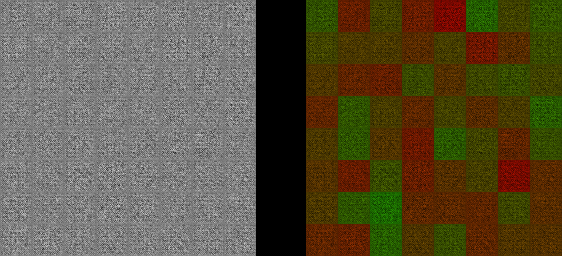

In [ ]:
#sample z
z = torch.randn((64,z_dim,1,1)).to(device)
# get G(z) and D(G(z))
samples = model.Generator(z)
predictions = model.Discriminator(samples)
# create the grid with the evaluation either samples from G and predictions from D
image_list = [get_image(sample) for sample in samples]
image_list_labels = [get_image_and_prediction(sample, prediction) for sample, prediction in zip(samples,predictions)]
grid = double_grid(image_list,image_list_labels,8,8)
grid

## 1.b Train

In [ ]:
batch_size = 64 # @param ["32", "64", "128", "256", "512"] {type:"raw"}
learning_rate = .0002 #@param {type:"number"}
beta1 = .5 #@param {type:"number"}
epochs = 15 # @param {type:"slider", min:10, max:100, step:1}
eval_steps = 30 # @param {type:"slider", min:10, max:100, step:10}

hparams = {
    "beta1":beta1,
    "lr": learning_rate
}

def my_collate(examples):
  pixel_values = torch.stack([torch.tensor(example['pixel_values']) for example in examples])
  return pixel_values

dataloader = torch.utils.data.DataLoader(dataset=dataset, batch_size=256, shuffle=True, collate_fn=my_collate)
model = DCGAN(z_dim, hidden_features, device)

In [ ]:
if os.path.exists("train_steps"):
    shutil.rmtree("train_steps")
os.mkdir("train_steps")
from tqdm import tqdm
D_loss, G_loss = [], []
model.train()
model.instatiate_optimizers(hparams)
for epoch in range(epochs):
    for step,x in enumerate(tqdm(dataloader)):
        lossD, lossG = model.train_step(x)
        D_loss.append(lossD)
        G_loss.append(lossG)
        if not step%eval_steps:
            with torch.no_grad():
                model.eval()
                # sample z
                eval_z = torch.randn((64,z_dim,1,1)).to(device)
                # get G(z) and D(G(z))
                samples = model.Generator(eval_z)
                predictions = model.Discriminator(samples).detach().cpu()
                samples = samples.detach().cpu()
                model.train()
            # create the grid with the evaluation either samples from G and predictions from D
            image_list = [get_image(sample) for sample in samples]
            image_list_labels = [get_image_and_prediction(sample, prediction) for sample, prediction in zip(samples,predictions)]
            grid = double_grid(image_list,image_list_labels,8,8)
            grid.save(f"train_steps/epoch_{epoch:03}_step_{step:03}.png")

    print(f"epoch: {epoch+1} | loss_D: {lossD:.3f} | loss_G: {lossG:.3f}")


100%|██████████| 235/235 [01:18<00:00,  3.01it/s]


epoch: 1 | loss_D: 0.253 | loss_G: 2.761


100%|██████████| 235/235 [01:16<00:00,  3.06it/s]


epoch: 2 | loss_D: 0.204 | loss_G: 3.068


100%|██████████| 235/235 [01:17<00:00,  3.02it/s]


epoch: 3 | loss_D: 0.530 | loss_G: 4.034


100%|██████████| 235/235 [01:17<00:00,  3.02it/s]


epoch: 4 | loss_D: 0.403 | loss_G: 1.328


100%|██████████| 235/235 [01:14<00:00,  3.16it/s]


epoch: 5 | loss_D: 0.956 | loss_G: 1.514


100%|██████████| 235/235 [01:15<00:00,  3.11it/s]


epoch: 6 | loss_D: 0.510 | loss_G: 1.872


100%|██████████| 235/235 [01:14<00:00,  3.16it/s]


epoch: 7 | loss_D: 0.293 | loss_G: 2.156


100%|██████████| 235/235 [01:14<00:00,  3.14it/s]


epoch: 8 | loss_D: 0.408 | loss_G: 2.633


100%|██████████| 235/235 [01:14<00:00,  3.16it/s]


epoch: 9 | loss_D: 0.283 | loss_G: 3.099


100%|██████████| 235/235 [01:15<00:00,  3.11it/s]


epoch: 10 | loss_D: 0.189 | loss_G: 3.611


100%|██████████| 235/235 [01:16<00:00,  3.08it/s]


epoch: 11 | loss_D: 0.170 | loss_G: 3.205


100%|██████████| 235/235 [01:13<00:00,  3.19it/s]


epoch: 12 | loss_D: 0.892 | loss_G: 1.541


100%|██████████| 235/235 [01:15<00:00,  3.10it/s]


epoch: 13 | loss_D: 0.088 | loss_G: 3.859


100%|██████████| 235/235 [01:16<00:00,  3.09it/s]


epoch: 14 | loss_D: 0.639 | loss_G: 2.094


100%|██████████| 235/235 [01:15<00:00,  3.12it/s]

epoch: 15 | loss_D: 0.056 | loss_G: 4.560


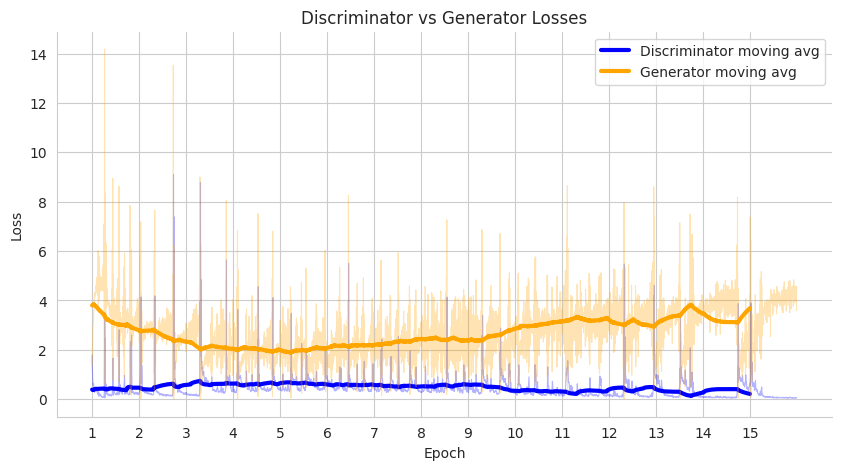

In [ ]:
# @title Generator and Discriminator Losses
sns.set_style('whitegrid')
def moving_average(x, n=3):
    ret = np.cumsum(x, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n
fig = plt.figure(figsize=(10,5))
plt.plot(D_loss,alpha=.3, color = 'blue', linewidth=.8)
plt.plot(moving_average(D_loss,n=235),label='Discriminator moving avg',alpha=1.0, color = 'blue', linewidth=3)
plt.plot(G_loss,alpha=.3, color = 'orange', linewidth=.8)
plt.plot(moving_average(G_loss,n=235),label='Generator moving avg',alpha=1.0, color = 'orange', linewidth=3)
plt.xticks(np.arange(15)*235,np.arange(1,16))
plt.title('Discriminator vs Generator Losses')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
sns.despine(top=True,right=True,trim=False, offset=0)
plt.show()

### Video of the evaluation steps in the training.
$G(z)$ vs $D(G(z))$

When the Discriminator is fooled by the Generator, there is an increment in the amount of `false_positive` predicted, marked as green in the right part of the grid.


In [ ]:
!ffmpeg -framerate 8 -pattern_type glob -i 'train_steps/*.png' -c:v libx264 -pix_fmt yuv420p training_video.mp4

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
show_video("training_video.mp4")

In [ ]:
# Save Generator state dict for later inference
torch.save(model.Generator.state_dict(), "DCGAN_Generator.pt")

### Load pretrained, confront $x$ (left side) with $G(z)$ (right side)

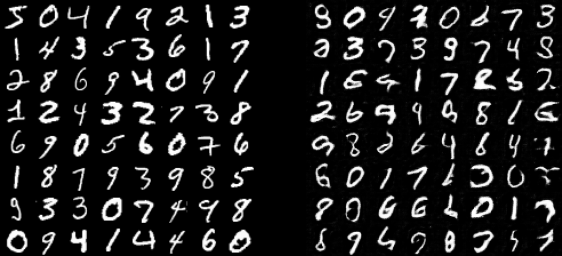

In [ ]:
# load the model
generator = Generator(z_dim, hidden_features).to(device)
generator.load_state_dict(torch.load("DCGAN_Generator.pt"))

# sample z
eval_z = torch.randn((64,z_dim,1,1)).to(device)
# get G(z) and D(G(z))
samples = generator(eval_z)
# confront
sample_list = [get_image(sample) for sample in samples]
ground_truth = [image.resize((32,32),Image.Resampling.BILINEAR) for image in dataset[:64]['image']]
double_grid(ground_truth, sample_list,8,8)

# 2 - Conditional-GAN

## 2.a Model Architecture
We can preserve the same structure of the previous DCGAN, having the same architecture of convolutional layer blocks, slightly modified to account for the conditioning input.
 Following , for the Generator, the condition input $c$ is the `one_hot encoding` of the digit class label and it is concatened to $z$, forming a condition vector of 110 dimension.
 For the discriminator, the conditioning input have a shape of `
 (num_classes, image_size//2,image_size//2)` and is added to the output of the first convolutional block, along the features axis.


In [ ]:
# @title Define Generator and Discriminator.
class Generator(nn.Module):
    def __init__(self, z_dim: int, n_classes:int, last_hidden_features:int):
        super(Generator, self).__init__()
        self.layers = nn.Sequential(                                                              # input + condition:  (bs, 100, 1, 1) + (bs, 10, 1, 1)
            self.make_transpose_block(z_dim+n_classes,last_hidden_features*4,4,1,0),                          # output: (bs, hidden_features*4, 4, 4)
            self.make_transpose_block(last_hidden_features*4,last_hidden_features*2,4,2,1),                   # output: (bs, hidden_features*2, 8, 8)
            self.make_transpose_block(last_hidden_features*2,last_hidden_features,4,2,1),                     # output: (bs, hidden_features, 16, 16)
            self.make_transpose_block(last_hidden_features,1,4,2,1, batch_norm = False, activation=False),    # output: (bs, 1, 32, 32)
            nn.Tanh()
        )

    def make_transpose_block(self, in_features:int , out_features: int, kernel_size:int, stride:int, padding:int, bias:bool = False, batch_norm:bool = True, activation:bool = True):
        modules = [
            nn.ConvTranspose2d(in_features, out_features, kernel_size, stride, padding, bias=bias)
        ]
        if batch_norm: modules += [nn.BatchNorm2d(out_features)]
        if activation: modules += [nn.ReLU(True)]
        return nn.Sequential(*modules)

    def forward(self, x:torch.Tensor, y:torch.Tensor):
        x = torch.cat([x,y],dim=1)
        return self.layers(x)

class Discriminator(nn.Module):
    def __init__(self, n_classes:int, hidden_dim:int):
        super(Discriminator, self).__init__()                                                         # input:  (bs, 1, 32, 32)
        self.layer_x = self.make_conv_block(1, hidden_dim, 4, 2, 1, batch_norm=False)                 # output: (bs, hidden_features, 16, 16)
        self.layer_xy = nn.Sequential(                                                    # condition      +    (bs, 10, 16, 16)
            self.make_conv_block(hidden_dim+n_classes, hidden_dim*2, 4, 2, 1),                        # output: (bs, hidden_features*2, 8, 8)
            self.make_conv_block(hidden_dim*2, hidden_dim*4, 4, 2, 1),                                # output: (bs, hidden_features*4, 4, 4)
            self.make_conv_block(hidden_dim*4, 1, 4, 1, 0, batch_norm = False, activation=False),     # output: (bs, 1, 1, 1)
            nn.Sigmoid()
        )

    def make_conv_block(self, in_features:int , out_features: int, kernel_size:int, stride:int, padding:int, bias:bool = False, batch_norm:bool = True, activation:bool = True):
        modules =  [
            nn.Conv2d(in_features, out_features, kernel_size, stride, padding, bias=bias)
        ]
        if batch_norm: modules += [nn.BatchNorm2d(out_features)]
        if activation: modules += [nn.LeakyReLU(0.2, inplace=True)]
        return nn.Sequential(*modules)


    def forward(self, x:torch.Tensor, y:torch.Tensor):
        x = self.layer_x(x)
        # concat the condition after first convolutional block, adding 10 extra-dimensions
        x = torch.cat([x,y],dim=1)
        x = self.layer_xy(x)
        return x.view(x.size(0),-1)

In [ ]:
# @title Define the cDCGAN
class cDCGAN(nn.Module):
    def __init__(self, z_dim: int, n_classes:int, hidden_features:int, device:str):
        super(cDCGAN, self).__init__()
        self.Generator = Generator(z_dim, n_classes, hidden_features).to(device)
        self.Discriminator = Discriminator(n_classes, hidden_features).to(device)
        # init weights
        self.Generator.apply(self.weights_init)
        self.Discriminator.apply(self.weights_init)
        # criterion
        self.criterion = nn.BCELoss()
        self.device = device
        self.z_dim = z_dim

    def weights_init(self, m):
        classname = m.__class__.__name__
        if classname.find('Conv') != -1:
            nn.init.normal_(m.weight.data, 0.0, 0.02)
        elif classname.find('BatchNorm') != -1:
            nn.init.normal_(m.weight.data, 1.0, 0.02)
            nn.init.constant_(m.bias.data, 0)

    def instatiate_optimizers(self, hparams:Dict):
        self.optimizerD = optim.Adam(self.Discriminator.parameters(), lr=hparams["lr"], betas=(hparams['beta1'], 0.999))
        self.optimizerG = optim.Adam(self.Generator.parameters(), lr=hparams["lr"], betas=(hparams['beta1'], 0.999))

    def train_step(self, x: torch.Tensor, y:torch.Tensor):
        ## Train with all-true batch
        # Discriminator
        self.Discriminator.zero_grad()
        # get real data and prepare labels (True)
        real_digits = x.to(self.device)
        bs = real_digits.size(0)
        labels = torch.ones((bs,1), dtype=torch.float, device=self.device)
        # get predictions for real data
        digit_labels_D = F.one_hot(y)[:,:,None,None].repeat(1,1,16,16).to(torch.float).to(self.device)
        output = self.Discriminator(real_digits, digit_labels_D)
        # Calculate loss on all-real batch
        loss_real = self.criterion(output, labels)
        # Calculate gradients for D in backward pass
        loss_real.backward()
        D_x = output.mean().item()

        ## Train with all-fake batch
        # Generate batch of latent vectors
        noise = torch.randn(bs, self.z_dim, 1, 1, device=self.device)
        # Generate fake image batch with G
        digit_labels_G = F.one_hot(y)[:,:,None,None].to(torch.float).to(self.device)
        fake_digits = self.Generator(noise, digit_labels_G)
        labels.fill_(0.0)
        # Classify all fake batch with D
        output = self.Discriminator(fake_digits.detach(),digit_labels_D)
        # Calculate D's loss on the all-fake batch
        loss_fake = self.criterion(output, labels)
        # Calculate the gradients for this batch, accumulated (summed) with previous gradients
        loss_fake.backward()
        D_G_z1 = output.mean().item()
        # Compute error of D as sum over the fake and the real batches
        lossD = loss_real + loss_fake
        # Update D
        self.optimizerD.step()


        ## Train Generator
        self.Generator.zero_grad()
        # set the lables for fake digit as True
        labels.fill_(1.0)
        # call Discriminator
        output = self.Discriminator(fake_digits,digit_labels_D)
        # Calculate G's loss based on Discrimnator predictions
        lossG = self.criterion(output, labels)
        # Calculate gradients for G
        lossG.backward()
        # Update G
        self.optimizerG.step()


        return lossD.item(), lossG.item()

In [ ]:
#@title Define hyperparameters
z_dim = 100 #@param {type:"integer"}
n_classes = 10 # @param ["10"] {type:"raw"}
hidden_features = 64 #@param {type:"integer"}

# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

model = cDCGAN(z_dim, n_classes, hidden_features, device)

Using device: cuda


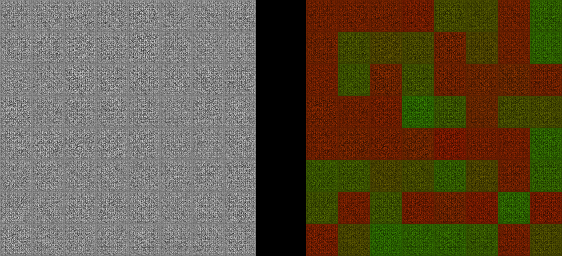

In [ ]:
#@title test the untrained model, by visualizing the output of $G(z,c)$ and $D(G(z,c))$
z_dim = 100
device = 'cuda'
# sample z
z = torch.randn((64,z_dim,1,1)).to(device)
# prepare condition
condition = F.one_hot(torch.randint(high=10,size=(1,64)).squeeze(0)).view(64,10,1,1).to(torch.float).to(device)
# G(z, c)
samples = model.Generator(z,condition)
# D(G(z, c))
condition = condition.repeat(1,1,16,16)
predictions = model.Discriminator(samples,condition)
# make the grid
image_list = [get_image(sample) for sample in samples]
image_list_labels = [get_image_and_prediction(sample, prediction) for sample, prediction in zip(samples,predictions)]
grid = double_grid(image_list,image_list_labels,8,8)
grid

## 2.b Train

In [ ]:
batch_size = 64 # @param ["32", "64", "128", "256", "512"] {type:"raw"}
learning_rate = .0002 #@param {type:"number"}
beta1 = .5 #@param {type:"number"}
epochs = 15 # @param {type:"slider", min:10, max:100, step:1}
eval_steps = 30 # @param {type:"slider", min:10, max:100, step:10}
hparams = {
    "beta1":beta1,
    "lr": learning_rate
}

def my_collate(examples):
  pixel_values = torch.stack([torch.tensor(example['pixel_values']) for example in examples])
  labels = torch.stack([torch.tensor(example['label']) for example in examples])
  return pixel_values, labels

# prepare the data loader
dataloader = torch.utils.data.DataLoader(dataset=dataset, batch_size=256, shuffle=True, collate_fn=my_collate)
# instatiate the model
model = cDCGAN(z_dim, n_classes, hidden_features, device)

In [ ]:
if os.path.exists("train_steps_c"):
    shutil.rmtree("train_steps_c")
os.mkdir("train_steps_c")
D_loss, G_loss = [], []
# prepare the condition fot the evaluation step
eval_conditionG = torch.cat([torch.empty(1,10,dtype=torch.long).fill_(i) for i in range(10)],dim=1).squeeze(0)
eval_conditionG = F.one_hot(eval_conditionG)[:,:,None,None].to(torch.float).to(device)
eval_conditionD = eval_conditionG.repeat(1,1,16,16).to(device)

# get optimizers
model.instatiate_optimizers(hparams)
model.train()
for epoch in range(epochs):
    for step,(x,y) in enumerate(tqdm(dataloader)):
        lossD, lossG = model.train_step(x,y)
        D_loss.append(lossD)
        G_loss.append(lossG)
        if not step%eval_steps:
            with torch.no_grad():
                model.eval()
                # sample z
                eval_z = torch.randn((100,z_dim,1,1)).to(device)
                # get G(z,c) and D(G(z,c))
                samples = model.Generator(eval_z,eval_conditionG)
                predictions = model.Discriminator(samples,eval_conditionD).detach().cpu()
                samples = samples.detach().cpu()
                model.train()
            # create the grid with the evaluation either samples from G and predictions from D
            image_list = [get_image(sample) for sample in samples]
            image_list_labels = [get_image_and_prediction(sample, prediction) for sample, prediction in zip(samples,predictions)]
            grid = double_grid(image_list,image_list_labels,10,10)
            grid.save(f"train_steps_c/epoch_{epoch:03}_step_{step:03}.png")

    print(f"epoch: {epoch+1} | loss_D: {lossD:.3f} | loss_G: {lossG:.3f}")


100%|██████████| 235/235 [01:15<00:00,  3.11it/s]


epoch: 1 | loss_D: 0.915 | loss_G: 2.225


100%|██████████| 235/235 [01:22<00:00,  2.84it/s]


epoch: 2 | loss_D: 0.643 | loss_G: 2.286


100%|██████████| 235/235 [01:17<00:00,  3.04it/s]


epoch: 3 | loss_D: 0.772 | loss_G: 2.515


100%|██████████| 235/235 [01:13<00:00,  3.19it/s]


epoch: 4 | loss_D: 0.826 | loss_G: 1.837


100%|██████████| 235/235 [01:27<00:00,  2.68it/s]


epoch: 5 | loss_D: 0.929 | loss_G: 1.068


100%|██████████| 235/235 [02:06<00:00,  1.86it/s]


epoch: 6 | loss_D: 0.942 | loss_G: 1.860


100%|██████████| 235/235 [01:49<00:00,  2.14it/s]


epoch: 7 | loss_D: 1.236 | loss_G: 0.723


100%|██████████| 235/235 [02:03<00:00,  1.90it/s]


epoch: 8 | loss_D: 1.022 | loss_G: 1.322


100%|██████████| 235/235 [01:33<00:00,  2.51it/s]


epoch: 9 | loss_D: 0.942 | loss_G: 1.364


100%|██████████| 235/235 [01:15<00:00,  3.12it/s]


epoch: 10 | loss_D: 0.688 | loss_G: 1.628


100%|██████████| 235/235 [01:19<00:00,  2.95it/s]


epoch: 11 | loss_D: 0.881 | loss_G: 1.188


100%|██████████| 235/235 [01:27<00:00,  2.67it/s]


epoch: 12 | loss_D: 1.072 | loss_G: 0.590


100%|██████████| 235/235 [01:15<00:00,  3.09it/s]


epoch: 13 | loss_D: 1.102 | loss_G: 1.000


100%|██████████| 235/235 [01:14<00:00,  3.16it/s]


epoch: 14 | loss_D: 1.294 | loss_G: 0.854


100%|██████████| 235/235 [01:16<00:00,  3.07it/s]

epoch: 15 | loss_D: 0.629 | loss_G: 1.617


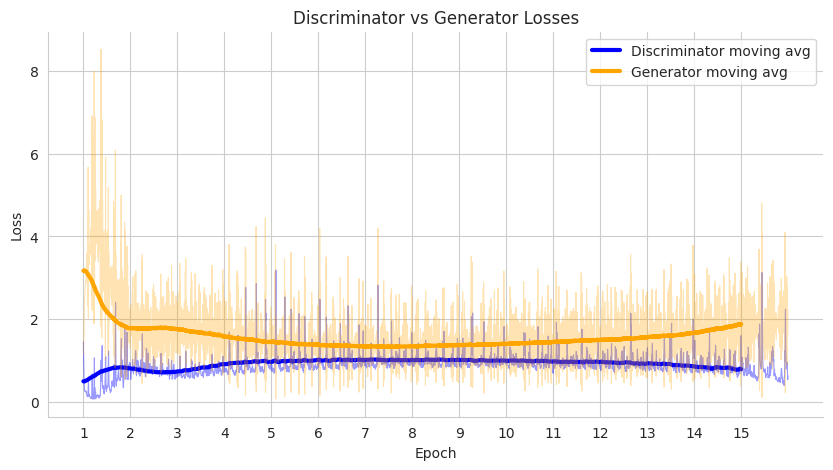

In [ ]:
# @title Generator and Discriminator Losses
sns.set_style('whitegrid')
def moving_average(x, n=3):
    ret = np.cumsum(x, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n
fig = plt.figure(figsize=(10,5))
plt.plot(D_loss,alpha=.4, color = 'blue', linewidth=.8)
plt.plot(moving_average(D_loss,n=235),label='Discriminator moving avg',alpha=1.0, color = 'blue', linewidth=3)
plt.plot(G_loss,alpha=.3, color = 'orange', linewidth=.8)
plt.plot(moving_average(G_loss,n=235),label='Generator moving avg',alpha=1.0, color = 'orange', linewidth=3)
plt.xticks(np.arange(15)*235,np.arange(1,16))
plt.title('Discriminator vs Generator Losses')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
sns.despine(top=True,right=True,trim=False, offset=0)
plt.show()

### Video of the evaluation steps in the training.
$G(z,c)$ vs $D(G(z,c))$

When the Discriminator is fooled by the Generator, there is an increment in the amount of `false_positive` predicted, marked as green in the right part of the grid.


In [ ]:
!ffmpeg -framerate 8 -pattern_type glob -i 'train_steps_c/*.png' -c:v libx264 -pix_fmt yuv420p training_video_c.mp4

ffmpeg version 4.4.2-0ubuntu0.22.04.1 Copyright (c) 2000-2021 the FFmpeg developers
  built with gcc 11 (Ubuntu 11.2.0-19ubuntu1)
  configuration: --prefix=/usr --extra-version=0ubuntu0.22.04.1 --toolchain=hardened --libdir=/usr/lib/x86_64-linux-gnu --incdir=/usr/include/x86_64-linux-gnu --arch=amd64 --enable-gpl --disable-stripping --enable-gnutls --enable-ladspa --enable-libaom --enable-libass --enable-libbluray --enable-libbs2b --enable-libcaca --enable-libcdio --enable-libcodec2 --enable-libdav1d --enable-libflite --enable-libfontconfig --enable-libfreetype --enable-libfribidi --enable-libgme --enable-libgsm --enable-libjack --enable-libmp3lame --enable-libmysofa --enable-libopenjpeg --enable-libopenmpt --enable-libopus --enable-libpulse --enable-librabbitmq --enable-librubberband --enable-libshine --enable-libsnappy --enable-libsoxr --enable-libspeex --enable-libsrt --enable-libssh --enable-libtheora --enable-libtwolame --enable-libvidstab --enable-libvorbis --enable-libvpx --enab

In [ ]:
show_video("training_video_c.mp4")

In [ ]:
torch.save(model.Generator.state_dict(), "cDCGAN_Generator.pt")

### Load pretrained, confront $x$ (left side) with $G(z,c)$ (right side)

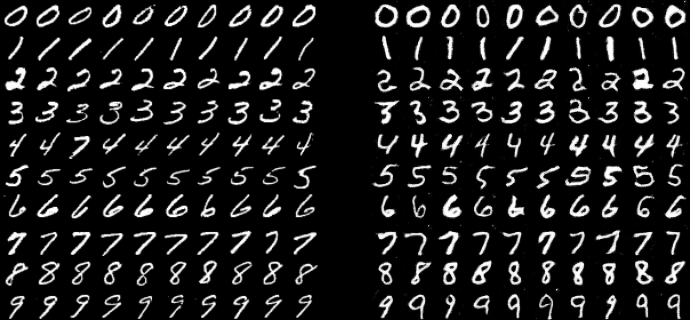

In [ ]:
# load the model
generator = Generator(z_dim, n_classes, hidden_features).to(device)
generator.load_state_dict(torch.load("cDCGAN_Generator.pt"))

generator.eval()
# sample z and prepare condition
z = torch.randn((100,100,1,1)).to(device)
labels = torch.cat([torch.empty(1,10,dtype=torch.long).fill_(i) for i in range(10)],dim=1).squeeze(0)
condition = F.one_hot(labels)[:,:,None,None].to(torch.float).to(device)
# generate samples
with torch.no_grad():
    G_samples = generator(z,condition)

# get the idx of the rows for each label class
dataset_sorted = dataset.sort("label")
labels, values  = np.unique(dataset_sorted['label'], return_counts=True)
row_dict = {l:v for v,l in zip(np.cumsum(values), labels)}
rows_to_select = []
for l,v in row_dict.items():
    rows_to_select.extend(np.arange(v-10,v,).tolist())
# select the row of interest (10 samples per digit)
selected = dataset_sorted.select(rows_to_select)
true_samples = [torch.tensor(image) for image in selected['pixel_values']]

image_G = [get_image(sample) for sample in G_samples]
image_true = [get_image(sample).resize((32,32),Image.Resampling.BILINEAR) for sample in true_samples]
double_grid(image_true,image_G,10,10)

# 3 - Add an Encoder

In [ ]:
torch.use_deterministic_algorithms(False)

## 3.a Model architecture

In [ ]:
# @title Define the Encoder
class Encoder(nn.Module):
    def __init__(self, z_dim:int, n_classes:int, hidden_dim:int, image_size:int):
        super(Encoder, self).__init__()
        self.conv_layers = nn.Sequential(                                        # input:  (bs, 1, 32, 32)
            self.make_conv_block(1, hidden_dim, 4, 2, 1),                        # output: (bs, hidden_dim, 16, 16)
            self.make_conv_block(hidden_dim, hidden_dim*2, 4, 2, 1),             # output: (bs, hidden_dim*2, 8, 8)
            self.make_conv_block(hidden_dim*2, hidden_dim*4, 4, 2, 1),           # output: (bs, hidden_dim*4, 4, 4)
        )
        self.linears = nn.Sequential(
            nn.Flatten(),                                                        # input:  (bs, hidden_dim*4*4*4)
            nn.Linear(hidden_dim*4*(image_size//8)**2, 512),                     # output: (bs, 512)
            nn.LeakyReLU(0.2, inplace=True),
            nn.Linear(512, z_dim+n_classes)                                      # output: (bs, 110)
        )
        self.n_classes = n_classes

    def make_conv_block(self,
                        in_features:int ,
                        out_features: int,
                        kernel_size:int,
                        stride:int,
                        padding:int,
                        bias:bool = False,
                        batch_norm:bool = True,
                        activation:bool = True):
        modules =  [
            nn.Conv2d(in_features, out_features, kernel_size, stride, padding, bias=bias)
        ]
        if batch_norm: modules += [nn.BatchNorm2d(out_features)]
        if activation: modules += [nn.LeakyReLU(0.2, inplace=True)]
        return nn.Sequential(*modules)


    def forward(self, x:torch.Tensor):
        x = self.conv_layers(x)
        x = self.linears(x)
        # split the features in z and y, and then apply Softmax only on y
        z_features, c_features = x[:,:-n_classes], x[:,-n_classes:]
        return z_features, F.softmax(c_features)

In [ ]:
# @title Define a class to wrap the Encoder and performing Inverse sampling, from $x$ to $z,c$
class JOJO(nn.Module):
    def __init__(self,
                 z_dim:int,
                 n_classes:int,
                 hidden_features:int,
                 image_size:int,
                 device:str,
                 pretrained_generator_state_dict:str):
        """
        Why JOJO?
        🎵 Get back, get back
        🎵 Get back to where you once belonged
        🎵 Get back Jojo!

         ////\\     //||\\     //\|\\      ///||\
         /`O-O'     ` @ @\     //o o//       a a
            ]          >        ) | (         _)
            -          -          -           ~
          John        Paul      George      Ringo

        """
        super(JOJO, self).__init__()
        # Generator
        self.Generator = Generator(z_dim, n_classes, hidden_features).to(device)
        # Encoder
        self.Encoder = Encoder(z_dim, n_classes, hidden_features, image_size).to(device)
        # load pretrained and freeze G
        self.init_Generator(pretrained_generator_state_dict)
        # criterion
        self.c_criterion = nn.CrossEntropyLoss()              # CrossEntropy cause we can choose c, by one_hot encoding the label with max prob
        self.criterion = nn.MSELoss(reduction='mean')       # Squared L2 norm between z_estimated and z
        self.n_classes = n_classes
        self.z_dim = z_dim
        # set up the optimzer
        self.optimizer = optim.Adam(self.Encoder.parameters(), lr=.0002)

    def init_Generator(self,pretrained_generator_state_dict:int):
        self.Generator.load_state_dict(torch.load(pretrained_generator_state_dict))
        for param in self.Generator.parameters():
            param.requires_grad = False
        self.Generator.eval()

    def train(self, batch_size:int, iterations:int, alpha:float=1.0, beta:float=1.0, gamma:float=1.0):
        self.Encoder.train()
        Z_loss, C_loss, Recon_Loss, C_accuracy = [], [], [], []
        pbar = tqdm(np.arange(iterations))
        for _ in pbar:
            self.optimizer.zero_grad()
            # sample z with random condition y
            z = torch.randn((batch_size,self.z_dim,1,1)).to(device)
            labels = torch.randint(self.n_classes,size=(batch_size,1)).view(-1).to(device)
            condition = F.one_hot(labels,num_classes=self.n_classes)[:,:,None,None].to(torch.float)
            # generate samples G(z)
            with torch.no_grad():
                samples = self.Generator(z,condition)
            # encode the samples E(G(z)), producing estimated z_ and c_
            z_, c_ = self.Encoder(samples)

            # compute loss for the z and c
            #full_latent_vector = torch.cat([z,condition],dim=1).view(batch_size,-1)
            #full_estimated_latent_vector = torch.cat([z_,c_],dim=1)
            z_loss = self.criterion(z_, z.view(batch_size,-1))
            c_loss = self.c_criterion(c_, labels.to(torch.long))

            # compute G(z_,c_) and measure MSE w.r.t. G(z,c)
            with torch.no_grad():
                reconstructed_samples = self.Generator(z_[:,:,None,None],c_[:,:,None,None])
            recon_loss = self.criterion(reconstructed_samples, samples)

            loss = alpha*z_loss + beta*recon_loss + gamma*c_loss

            # update weights
            loss.backward()
            self.optimizer.step()

            C_loss.append(c_loss.item())
            Z_loss.append(z_loss.item())
            Recon_Loss.append(recon_loss.item())

            # metrics
            c_accuracy = torch.sum(torch.argmax(c_,dim=-1) == labels)/batch_size
            z_distance = (z_ - z.view(batch_size,-1)).pow(2).mean(1).sqrt().mean()
            C_accuracy.append(c_accuracy.item())

            pbar.set_description(f"z_loss: {z_loss:.3f} | c_loss: {c_loss:.3f} | recon_loss: {recon_loss:.3f} | c_accuracy: {c_accuracy*100:.2f}% | z_distance: {z_distance:.2f}")


        return Z_loss, C_loss, Recon_Loss, C_accuracy



## 3.b Train

In [ ]:
n_classes = 10 # @param ["10"] {type:"raw"}

image_size = 32 # @param ["32"] {type:"raw"}

z_dim = 100 #@param {type:"integer"}
hidden_features = 64 # @param ["32", "64", "128"] {type:"raw"}

batch_size = 64 # @param ["32", "64", "128", "256", "512"] {type:"raw"}
iterations = 10000 # @param {type:"slider", min:1000, max:20000, step:1000}


# Device configuration
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

hparams = {
    "beta1":0.5,
    "lr": .0002
}

print(f"Total numbers of samples: {iterations*batch_size}")

model = JOJO(z_dim, n_classes, hidden_features, image_size, device, "cDCGAN_Generator.pt")

Using device: cuda
Total numbers of samples: 640000


In [ ]:
Z_loss, C_loss, Recon_Loss, C_accuracy = model.train(batch_size, iterations)

  0%|          | 0/10000 [00:00<?, ?it/s]<ipython-input-34-1e0c13701caf>:40: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return z_features, F.softmax(c_features)
z_loss: 0.800 | c_loss: 1.461 | recon_loss: 0.053 | c_accuracy: 100.00% | z_distance: 0.89: 100%|██████████| 10000/10000 [01:57<00:00, 85.14it/s]


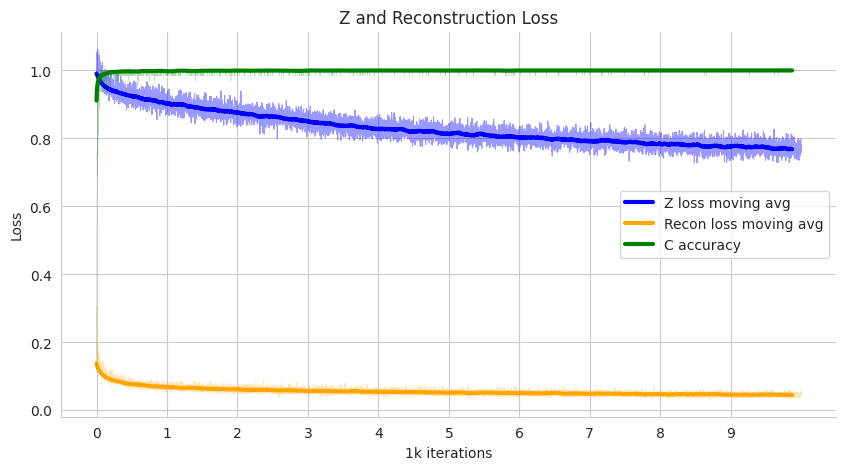

In [ ]:
# @title Generator and Discriminator Losses
sns.set_style('whitegrid')
def moving_average(x, n=3):
    ret = np.cumsum(x, dtype=float)
    ret[n:] = ret[n:] - ret[:-n]
    return ret[n - 1:] / n
fig = plt.figure(figsize=(10,5))
# Z
plt.plot(Z_loss,alpha=.4, color = 'blue', linewidth=.8)
plt.plot(moving_average(Z_loss,n=128),label='Z loss moving avg',alpha=1.0, color = 'blue', linewidth=3)
# Recon
plt.plot(Recon_Loss,alpha=.3, color = 'orange', linewidth=.8)
plt.plot(moving_average(Recon_Loss,n=128),label='Recon loss moving avg',alpha=1.0, color = 'orange', linewidth=3)
# C_accuracy
plt.plot(C_accuracy,alpha=.3, color = 'green', linewidth=.3)
plt.plot(moving_average(C_accuracy,n=128),alpha=1.0,label='C accuracy', color = 'green', linewidth=3)
plt.xticks(np.arange(10)*1000,np.arange(0,10))
plt.title('Z and Reconstruction Loss')
plt.xlabel('1k iterations')
plt.ylabel('Loss')
plt.legend()
sns.despine(top=True,right=True,trim=False, offset=0)
plt.show()

In [ ]:
torch.save(model.Encoder.state_dict(), "Encoder.pt")

## 3.c Evaluate the Encoder with unseen data (test set)




In [ ]:
# @title Select test split from the MNIST and select 10 images per digit
image_size = 32
# MNIST Dataset
transform = transforms.Compose([
    transforms.Resize(image_size),
    transforms.ToTensor(),
    transforms.Normalize(mean=(0.5), std=(0.5))])

def preprocess_function(examples):
  examples['pixel_values'] = [transform(image) for image in examples['image']]
  return examples

dataset = load_dataset("mnist", split="test")
dataset = dataset.map(preprocess_function, batched=True)

# get the idx of the rows for each label class
dataset = dataset.sort("label")
labels, values  = np.unique(dataset['label'], return_counts=True)
row_dict = {l:v for v,l in zip(np.cumsum(values), labels)}
rows_to_select = []
for l,v in row_dict.items():
    rows_to_select.extend(np.arange(v-10,v,).tolist())
# select the row of interest (10 samples per digit)
selected = dataset.select(rows_to_select)


inferred_labels accuracy on test set: 0.94



<ipython-input-34-1e0c13701caf>:40: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return z_features, F.softmax(c_features)


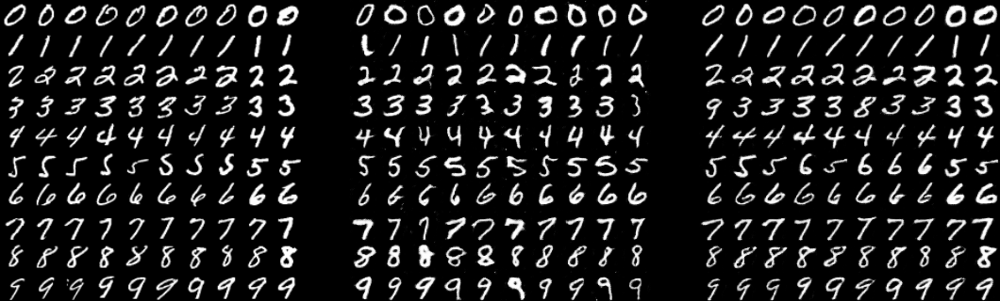

In [ ]:
# @title Load pretrained, confront $x$ (left) - $G(z,c)$ (middle) - $G(E(x)_z,E(x)_c)$ (right)
# load G and E
generator = Generator(z_dim, n_classes, hidden_features).to(device)
encoder = Encoder(z_dim, n_classes, hidden_features, image_size).to(device)
generator.load_state_dict(torch.load("cDCGAN_Generator.pt"))
encoder.load_state_dict(torch.load("Encoder.pt"))

# generate samples
true_samples = [torch.tensor(image) for image in selected['pixel_values']]
## G(z,c)
# sample z and prepare condition
z = torch.randn((100,100,1,1)).to(device)
labels = torch.cat([torch.empty(1,10,dtype=torch.long).fill_(i) for i in range(10)],dim=1).squeeze(0)
condition = F.one_hot(labels)[:,:,None,None].to(torch.float).to(device)

# generate samples
with torch.no_grad():
    G_samples = generator(z,condition)

# G(E(x)z,E(x)c)
encoder.eval()
with torch.no_grad():
    z_,c_ = encoder(torch.stack(true_samples).to(device))
    c_ = torch.argmax(c_,dim=-1)
    condition_ = F.one_hot(c_)[:,:,None,None].to(torch.float)
    G_E_samples = generator(z_[:,:,None,None],condition_)
    c_accuracy = torch.sum(c_.detach().cpu() == labels)/100
    print(f"\ninferred_labels accuracy on test set: {c_accuracy:.2f}\n")

# @title  Visualize the result.
def triple_grid(imgs_1,imgs_2,imgs_3, rows, cols, offset:int=50):
    assert len(imgs_1)+len(imgs_2)+len(imgs_3) == rows*(cols*3)
    assert imgs_1[0].size == imgs_2[0].size
    w, h = imgs_1[0].size
    grid = Image.new('RGB', size=(cols*w*3+offset*2, rows*h))
    grid_w, grid_h = grid.size
    for i, (img1,img2,img3) in enumerate(zip(imgs_1,imgs_2,imgs_3)):
        grid.paste(img1, box=(i%cols*w, i//cols*h))
        grid.paste(img2, box=(i%cols*w+cols*w+offset, i//cols*h))
        grid.paste(img3, box=(i%cols*w+cols*w*2+offset*2, i//cols*h))
    return grid
true_image_list = [get_image(sample) for sample in true_samples]
G_image_list = [get_image(sample) for sample in G_samples]
G_E_image_list = [get_image(sample) for sample in G_E_samples]
triple_grid(true_image_list,G_image_list,G_E_image_list, 10, 10)

## 3.d Play with the Encoder


### Change thickness and rotation
Let's choose 2 samples, one from $x$ and one from $G(z)$, in such way that they differs in rotation and thickness.
If we call the encoder to guess $z$, we can interpolate between the two $z$ to control the rotation and the thickness of the generated digits

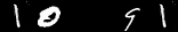

In [ ]:
target_rotation_thickness = [get_image(sample) for sample in (G_samples[13],true_samples[9])]
target_rotation = [get_image(sample) for sample in (true_samples[-10],G_samples[13])]
double_grid(target_rotation_thickness,target_rotation, 1, 2)

<ipython-input-34-1e0c13701caf>:40: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return z_features, F.softmax(c_features)


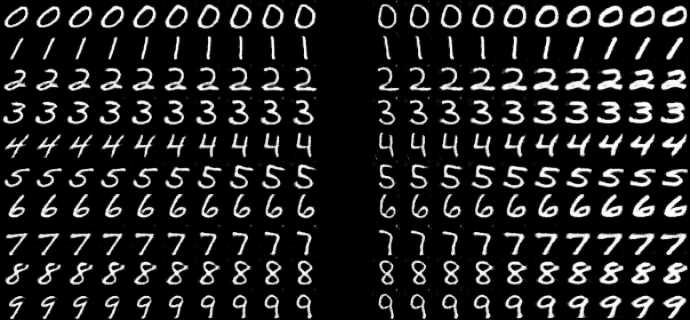

In [ ]:
to_inspect_later = []
target = torch.stack([true_samples[-10],G_samples[13].detach().cpu()])
with torch.no_grad():
    z_,c_ = model.Encoder(target.to(device))
    to_inspect_later.append(z_[1].detach().cpu())
    # interpolate between the two z_ in 10 step. Repeating that 10 times, to evaluate the result with every label condition
    lerped_z = torch.stack([torch.lerp(z_[0],z_[1],w) for w in torch.linspace(0,1,10).to(device)] * 10)
    labels = torch.cat([torch.empty(1,10,dtype=torch.long).fill_(i) for i in range(10)],dim=1).squeeze(0)
    condition_ = F.one_hot(labels)[:,:,None,None].to(torch.float).to(device)
    G_E_samples = model.Generator(lerped_z[:,:,None,None],condition_)
G_E_rotation_tickness = [get_image(sample) for sample in G_E_samples]

target = torch.stack([G_samples[13].detach().cpu(),true_samples[9]])
with torch.no_grad():
    z_,c_ = model.Encoder(target.to(device))
    to_inspect_later.append(z_[1].detach().cpu())
    # interpolate between the two z_ in 10 step. Repeating that 10 times, to evaluate the result with every label condition
    lerped_z = torch.stack([torch.lerp(z_[0],z_[1],w) for w in torch.linspace(0,1,10).to(device)] * 10)
    labels = torch.cat([torch.empty(1,10,dtype=torch.long).fill_(i) for i in range(10)],dim=1).squeeze(0)
    condition_ = F.one_hot(labels)[:,:,None,None].to(torch.float).to(device)
    G_E_samples = model.Generator(lerped_z[:,:,None,None],condition_)
G_E_rotation = [get_image(sample) for sample in G_E_samples]
double_grid(G_E_rotation_tickness,G_E_rotation, 10, 10)

### See the distributions of $E(x)$ for MNIST test set

In [ ]:
true_samples = [torch.tensor(image) for image in dataset['pixel_values']]
true_labels = [torch.tensor(label) for label in dataset['label']]

In [ ]:
batches = torch.split(torch.stack(true_samples),128)
batches_labels = torch.split(torch.stack(true_labels),128)
# E(x)
encoder.eval()
z_encoded = []
c_accuracy = []
labels_list = []
with torch.no_grad():
    for batch,labels in zip(batches,batches_labels):
        z_,c_ = encoder(batch.to(device))
        z_encoded.append(z_.detach().cpu())
        # inspect for the label
        c_ = torch.argmax(c_,dim=-1)
        c_accuracy.append(torch.sum(c_.detach().cpu() == labels)/128)
        labels_list.extend(labels.detach().cpu().numpy().tolist())
print(f"\ninferred_labels accuracy on test set: {np.mean(c_accuracy):.2f}\n")
z_encoded = torch.cat(z_encoded,dim=0)

<ipython-input-34-1e0c13701caf>:40: UserWarning: Implicit dimension choice for softmax has been deprecated. Change the call to include dim=X as an argument.
  return z_features, F.softmax(c_features)



inferred_labels accuracy on test set: 0.94



 PCA explained_variance_ratio[0.07828077 0.055764  ]


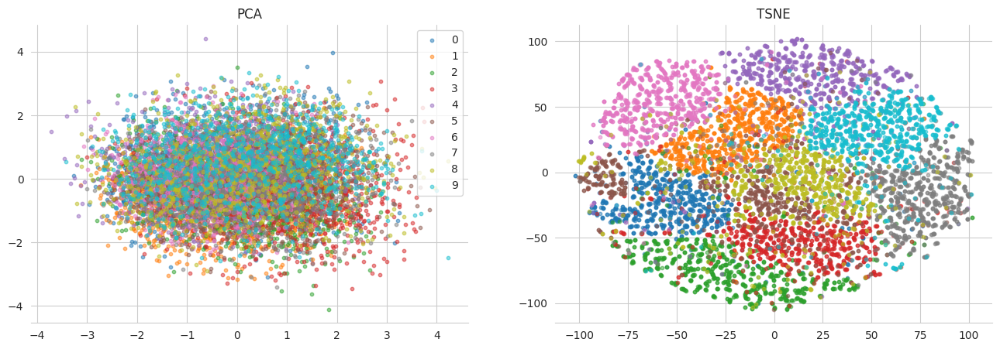

In [ ]:
import seaborn as sns
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA

def plot_reduction(X_pca,X_tsne,labels):
    sns.set_style('whitegrid')
    fig, ax = plt.subplots(1,2, figsize=(16,5))

    for i, l in enumerate(np.unique(labels)):
        ix = np.where(labels == l)
        ax[0].scatter(X_pca[:,0][ix], X_pca[:,1][ix], label = l, s=10, alpha= .5)
        ax[1].scatter(X_tsne[:,0][ix], X_tsne[:,1][ix], label = l, s=10, alpha= .5)

    ax[0].set_title('PCA')
    ax[1].set_title('TSNE')

    ax[0].legend()
    sns.despine(left=True,top=True)
    plt.show()

# PCA
pca = PCA(n_components=2)
z_PCA = pca.fit_transform(z_encoded)
print(f" PCA explained_variance_ratio{pca.explained_variance_ratio_}")
# TSNE
z_TSNE = TSNE(n_components=2, learning_rate='auto',
                  init='random', perplexity=3).fit_transform(z_encoded)

plot_reduction(z_PCA,z_TSNE,labels_list)

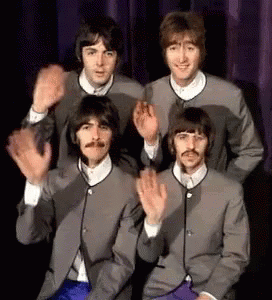

In [ ]:
import IPython.display as display
display.Image(open("goodbye.gif", 'rb').read())